In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seem for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [2]:
# Root directory for dataset
dataroot = "/home/ubuntu/data/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 50

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

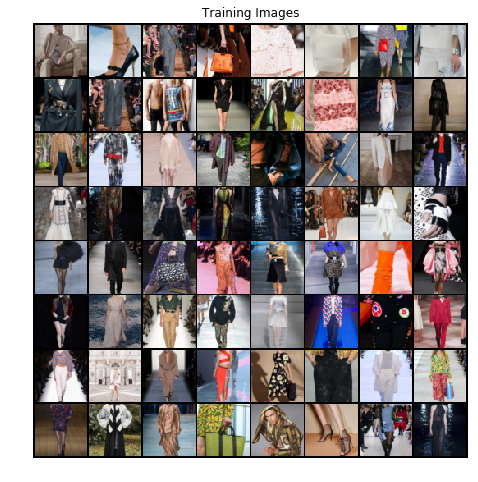

In [3]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [4]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [6]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [7]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [8]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [9]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [10]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
#         print("b_size ", b_size)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
#         print("output ", output.shape)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/50][0/79]	Loss_D: 1.8785	Loss_G: 5.0535	D(x): 0.4738	D(G(z)): 0.5771 / 0.0103
[0/50][50/79]	Loss_D: 0.1507	Loss_G: 11.6839	D(x): 0.9130	D(G(z)): 0.0020 / 0.0000


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[1/50][0/79]	Loss_D: 0.1609	Loss_G: 6.0663	D(x): 0.9003	D(G(z)): 0.0039 / 0.0054


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[1/50][50/79]	Loss_D: 0.4134	Loss_G: 4.6274	D(x): 0.8779	D(G(z)): 0.2021 / 0.0136
[2/50][0/79]	Loss_D: 0.6386	Loss_G: 4.0119	D(x): 0.9019	D(G(z)): 0.3693 / 0.0294


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[2/50][50/79]	Loss_D: 0.5625	Loss_G: 4.1899	D(x): 0.6644	D(G(z)): 0.0273 / 0.0255
[3/50][0/79]	Loss_D: 0.1911	Loss_G: 6.2958	D(x): 0.8717	D(G(z)): 0.0365 / 0.0034


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[3/50][50/79]	Loss_D: 0.3862	Loss_G: 4.3406	D(x): 0.8383	D(G(z)): 0.1127 / 0.0201
[4/50][0/79]	Loss_D: 0.2360	Loss_G: 5.1129	D(x): 0.8510	D(G(z)): 0.0240 / 0.0085


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[4/50][50/79]	Loss_D: 1.5892	Loss_G: 2.5177	D(x): 0.4718	D(G(z)): 0.2159 / 0.2429
[5/50][0/79]	Loss_D: 0.5822	Loss_G: 2.9451	D(x): 0.6919	D(G(z)): 0.0872 / 0.0866


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[5/50][50/79]	Loss_D: 0.7355	Loss_G: 1.3047	D(x): 0.5651	D(G(z)): 0.0274 / 0.3098
[6/50][0/79]	Loss_D: 0.4704	Loss_G: 4.2924	D(x): 0.8704	D(G(z)): 0.2539 / 0.0180


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[6/50][50/79]	Loss_D: 0.5202	Loss_G: 5.0947	D(x): 0.8916	D(G(z)): 0.2996 / 0.0134
[7/50][0/79]	Loss_D: 1.3656	Loss_G: 6.2403	D(x): 0.9318	D(G(z)): 0.5579 / 0.0180


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[7/50][50/79]	Loss_D: 0.5679	Loss_G: 7.0281	D(x): 0.8999	D(G(z)): 0.3117 / 0.0013
[8/50][0/79]	Loss_D: 0.3170	Loss_G: 4.4004	D(x): 0.9398	D(G(z)): 0.2001 / 0.0203
[8/50][50/79]	Loss_D: 0.6058	Loss_G: 3.8014	D(x): 0.6999	D(G(z)): 0.0678 / 0.0502


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[9/50][0/79]	Loss_D: 0.3215	Loss_G: 4.0950	D(x): 0.8723	D(G(z)): 0.1459 / 0.0247


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[9/50][50/79]	Loss_D: 0.3387	Loss_G: 4.8996	D(x): 0.9158	D(G(z)): 0.1868 / 0.0135
[10/50][0/79]	Loss_D: 0.4487	Loss_G: 2.9932	D(x): 0.8054	D(G(z)): 0.1664 / 0.0713
[10/50][50/79]	Loss_D: 0.5234	Loss_G: 4.0693	D(x): 0.8672	D(G(z)): 0.2633 / 0.0245


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[11/50][0/79]	Loss_D: 0.6404	Loss_G: 4.0587	D(x): 0.6345	D(G(z)): 0.0287 / 0.0324


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[11/50][50/79]	Loss_D: 0.4210	Loss_G: 4.7138	D(x): 0.8704	D(G(z)): 0.1939 / 0.0205
[12/50][0/79]	Loss_D: 0.4660	Loss_G: 3.8275	D(x): 0.7513	D(G(z)): 0.0932 / 0.0437


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[12/50][50/79]	Loss_D: 0.4755	Loss_G: 3.1249	D(x): 0.7819	D(G(z)): 0.1357 / 0.0767
[13/50][0/79]	Loss_D: 0.7820	Loss_G: 5.7443	D(x): 0.8411	D(G(z)): 0.3688 / 0.0070


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[13/50][50/79]	Loss_D: 0.5669	Loss_G: 3.1429	D(x): 0.7172	D(G(z)): 0.1170 / 0.0740
[14/50][0/79]	Loss_D: 0.2951	Loss_G: 3.7041	D(x): 0.8550	D(G(z)): 0.0972 / 0.0437


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[14/50][50/79]	Loss_D: 0.6929	Loss_G: 4.8662	D(x): 0.9171	D(G(z)): 0.3987 / 0.0156
[15/50][0/79]	Loss_D: 0.8621	Loss_G: 3.9929	D(x): 0.7471	D(G(z)): 0.2931 / 0.0420
[15/50][50/79]	Loss_D: 0.5120	Loss_G: 2.7977	D(x): 0.7443	D(G(z)): 0.1225 / 0.1073


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[16/50][0/79]	Loss_D: 0.3298	Loss_G: 3.8881	D(x): 0.8267	D(G(z)): 0.0858 / 0.0379


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[16/50][50/79]	Loss_D: 0.6633	Loss_G: 3.6551	D(x): 0.8135	D(G(z)): 0.3099 / 0.0397
[17/50][0/79]	Loss_D: 0.9469	Loss_G: 2.9003	D(x): 0.5261	D(G(z)): 0.0423 / 0.0965
[17/50][50/79]	Loss_D: 0.4686	Loss_G: 3.4254	D(x): 0.8029	D(G(z)): 0.1695 / 0.0524


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[18/50][0/79]	Loss_D: 0.6401	Loss_G: 5.5206	D(x): 0.9263	D(G(z)): 0.3833 / 0.0075
[18/50][50/79]	Loss_D: 0.5273	Loss_G: 4.4319	D(x): 0.7535	D(G(z)): 0.1548 / 0.0249


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[19/50][0/79]	Loss_D: 0.3298	Loss_G: 5.2035	D(x): 0.9375	D(G(z)): 0.2124 / 0.0094


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[19/50][50/79]	Loss_D: 0.5444	Loss_G: 3.2646	D(x): 0.7580	D(G(z)): 0.1713 / 0.0648
[20/50][0/79]	Loss_D: 1.0845	Loss_G: 6.3716	D(x): 0.9644	D(G(z)): 0.5816 / 0.0033


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[20/50][50/79]	Loss_D: 0.9958	Loss_G: 2.3365	D(x): 0.4719	D(G(z)): 0.0247 / 0.1664
[21/50][0/79]	Loss_D: 0.4761	Loss_G: 2.5728	D(x): 0.7560	D(G(z)): 0.0939 / 0.1172


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[21/50][50/79]	Loss_D: 0.4555	Loss_G: 3.9291	D(x): 0.8286	D(G(z)): 0.1924 / 0.0317
[22/50][0/79]	Loss_D: 0.2781	Loss_G: 3.7344	D(x): 0.8589	D(G(z)): 0.0943 / 0.0439
[22/50][50/79]	Loss_D: 0.5782	Loss_G: 2.7169	D(x): 0.7706	D(G(z)): 0.1922 / 0.1008


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[23/50][0/79]	Loss_D: 0.5353	Loss_G: 2.7078	D(x): 0.7070	D(G(z)): 0.0943 / 0.1116


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[23/50][50/79]	Loss_D: 0.7738	Loss_G: 5.5096	D(x): 0.9120	D(G(z)): 0.4252 / 0.0083
[24/50][0/79]	Loss_D: 0.3346	Loss_G: 3.5424	D(x): 0.8129	D(G(z)): 0.0906 / 0.0475


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[24/50][50/79]	Loss_D: 1.6968	Loss_G: 7.5772	D(x): 0.9668	D(G(z)): 0.7194 / 0.0018
[25/50][0/79]	Loss_D: 0.3902	Loss_G: 3.3986	D(x): 0.7949	D(G(z)): 0.1126 / 0.0602


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[25/50][50/79]	Loss_D: 0.4868	Loss_G: 3.6063	D(x): 0.7499	D(G(z)): 0.1043 / 0.0544
[26/50][0/79]	Loss_D: 0.4798	Loss_G: 4.1050	D(x): 0.8789	D(G(z)): 0.2463 / 0.0292
[26/50][50/79]	Loss_D: 0.4003	Loss_G: 3.4654	D(x): 0.8546	D(G(z)): 0.1831 / 0.0474


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[27/50][0/79]	Loss_D: 0.6711	Loss_G: 4.3985	D(x): 0.8957	D(G(z)): 0.3611 / 0.0201
[27/50][50/79]	Loss_D: 0.6774	Loss_G: 3.4847	D(x): 0.8110	D(G(z)): 0.3102 / 0.0477


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[28/50][0/79]	Loss_D: 0.5355	Loss_G: 2.7991	D(x): 0.8295	D(G(z)): 0.2190 / 0.1107
[28/50][50/79]	Loss_D: 0.8454	Loss_G: 5.7039	D(x): 0.9483	D(G(z)): 0.4794 / 0.0080


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[29/50][0/79]	Loss_D: 0.5867	Loss_G: 2.9506	D(x): 0.7913	D(G(z)): 0.2431 / 0.0749


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[29/50][50/79]	Loss_D: 0.8893	Loss_G: 3.6867	D(x): 0.7737	D(G(z)): 0.4114 / 0.0395
[30/50][0/79]	Loss_D: 0.4338	Loss_G: 3.0191	D(x): 0.8226	D(G(z)): 0.1775 / 0.0705
[30/50][50/79]	Loss_D: 0.6685	Loss_G: 4.4609	D(x): 0.9413	D(G(z)): 0.3815 / 0.0193


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[31/50][0/79]	Loss_D: 0.7697	Loss_G: 5.9965	D(x): 0.9575	D(G(z)): 0.4519 / 0.0038


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[31/50][50/79]	Loss_D: 0.3779	Loss_G: 3.3226	D(x): 0.8449	D(G(z)): 0.1579 / 0.0510
[32/50][0/79]	Loss_D: 2.4430	Loss_G: 0.1977	D(x): 0.1623	D(G(z)): 0.0029 / 0.8447


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[32/50][50/79]	Loss_D: 0.4176	Loss_G: 3.2474	D(x): 0.8298	D(G(z)): 0.1778 / 0.0540
[33/50][0/79]	Loss_D: 0.3835	Loss_G: 2.3915	D(x): 0.7773	D(G(z)): 0.0944 / 0.1236


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[33/50][50/79]	Loss_D: 0.4144	Loss_G: 3.7257	D(x): 0.8918	D(G(z)): 0.2261 / 0.0354
[34/50][0/79]	Loss_D: 0.4847	Loss_G: 2.7217	D(x): 0.8381	D(G(z)): 0.2233 / 0.0927
[34/50][50/79]	Loss_D: 0.4101	Loss_G: 2.5074	D(x): 0.8217	D(G(z)): 0.1657 / 0.1140


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[35/50][0/79]	Loss_D: 0.4520	Loss_G: 4.0970	D(x): 0.8869	D(G(z)): 0.2524 / 0.0256


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[35/50][50/79]	Loss_D: 0.4579	Loss_G: 2.7186	D(x): 0.7882	D(G(z)): 0.1549 / 0.0974
[36/50][0/79]	Loss_D: 0.4315	Loss_G: 3.1629	D(x): 0.7893	D(G(z)): 0.1301 / 0.0620
[36/50][50/79]	Loss_D: 0.9642	Loss_G: 6.0133	D(x): 0.9296	D(G(z)): 0.5126 / 0.0055


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[37/50][0/79]	Loss_D: 0.3866	Loss_G: 2.5733	D(x): 0.7679	D(G(z)): 0.0871 / 0.1034


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[37/50][50/79]	Loss_D: 1.0637	Loss_G: 5.3058	D(x): 0.9225	D(G(z)): 0.5409 / 0.0109
[38/50][0/79]	Loss_D: 0.6000	Loss_G: 4.7174	D(x): 0.9287	D(G(z)): 0.3567 / 0.0147
[38/50][50/79]	Loss_D: 0.4681	Loss_G: 2.7178	D(x): 0.7569	D(G(z)): 0.1323 / 0.0982


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[39/50][0/79]	Loss_D: 1.3069	Loss_G: 6.4426	D(x): 0.9854	D(G(z)): 0.6340 / 0.0043


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[39/50][50/79]	Loss_D: 0.3215	Loss_G: 2.9707	D(x): 0.8268	D(G(z)): 0.0972 / 0.0736
[40/50][0/79]	Loss_D: 0.4309	Loss_G: 3.7393	D(x): 0.8702	D(G(z)): 0.2187 / 0.0364


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[40/50][50/79]	Loss_D: 0.4385	Loss_G: 3.7182	D(x): 0.8513	D(G(z)): 0.2107 / 0.0392
[41/50][0/79]	Loss_D: 0.4250	Loss_G: 1.9629	D(x): 0.7225	D(G(z)): 0.0582 / 0.2115


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[41/50][50/79]	Loss_D: 0.6467	Loss_G: 4.4392	D(x): 0.8908	D(G(z)): 0.3664 / 0.0187
[42/50][0/79]	Loss_D: 0.2731	Loss_G: 3.3049	D(x): 0.8632	D(G(z)): 0.0975 / 0.0582


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[42/50][50/79]	Loss_D: 0.4935	Loss_G: 2.1547	D(x): 0.6881	D(G(z)): 0.0579 / 0.1619
[43/50][0/79]	Loss_D: 0.3195	Loss_G: 3.0218	D(x): 0.7829	D(G(z)): 0.0516 / 0.0772


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[43/50][50/79]	Loss_D: 0.4851	Loss_G: 3.5420	D(x): 0.8908	D(G(z)): 0.2683 / 0.0436
[44/50][0/79]	Loss_D: 0.3640	Loss_G: 3.5254	D(x): 0.9110	D(G(z)): 0.2143 / 0.0446


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[44/50][50/79]	Loss_D: 0.3344	Loss_G: 2.9073	D(x): 0.8375	D(G(z)): 0.1186 / 0.0825
[45/50][0/79]	Loss_D: 0.3729	Loss_G: 3.3373	D(x): 0.8025	D(G(z)): 0.1077 / 0.0571


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[45/50][50/79]	Loss_D: 0.7265	Loss_G: 4.4525	D(x): 0.8833	D(G(z)): 0.3989 / 0.0182
[46/50][0/79]	Loss_D: 0.5879	Loss_G: 2.3433	D(x): 0.6286	D(G(z)): 0.0445 / 0.1442


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[46/50][50/79]	Loss_D: 0.2552	Loss_G: 3.7062	D(x): 0.8372	D(G(z)): 0.0540 / 0.0406
[47/50][0/79]	Loss_D: 0.4056	Loss_G: 4.1289	D(x): 0.8750	D(G(z)): 0.2078 / 0.0259


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[47/50][50/79]	Loss_D: 0.4506	Loss_G: 4.0266	D(x): 0.9369	D(G(z)): 0.2793 / 0.0333
[48/50][0/79]	Loss_D: 0.3036	Loss_G: 2.7652	D(x): 0.8172	D(G(z)): 0.0765 / 0.0857


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[48/50][50/79]	Loss_D: 0.4360	Loss_G: 2.2188	D(x): 0.7475	D(G(z)): 0.0946 / 0.1453
[49/50][0/79]	Loss_D: 0.3405	Loss_G: 3.1027	D(x): 0.8478	D(G(z)): 0.1347 / 0.0701
[49/50][50/79]	Loss_D: 0.3935	Loss_G: 3.2441	D(x): 0.8563	D(G(z)): 0.1848 / 0.0587


/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


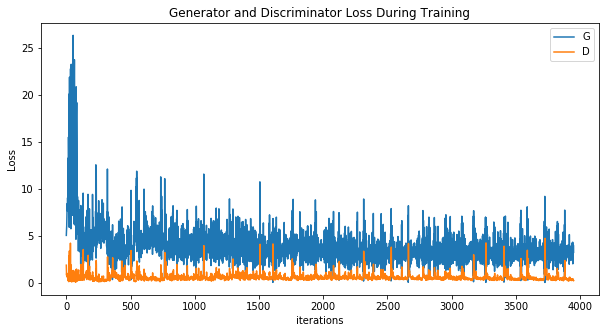

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

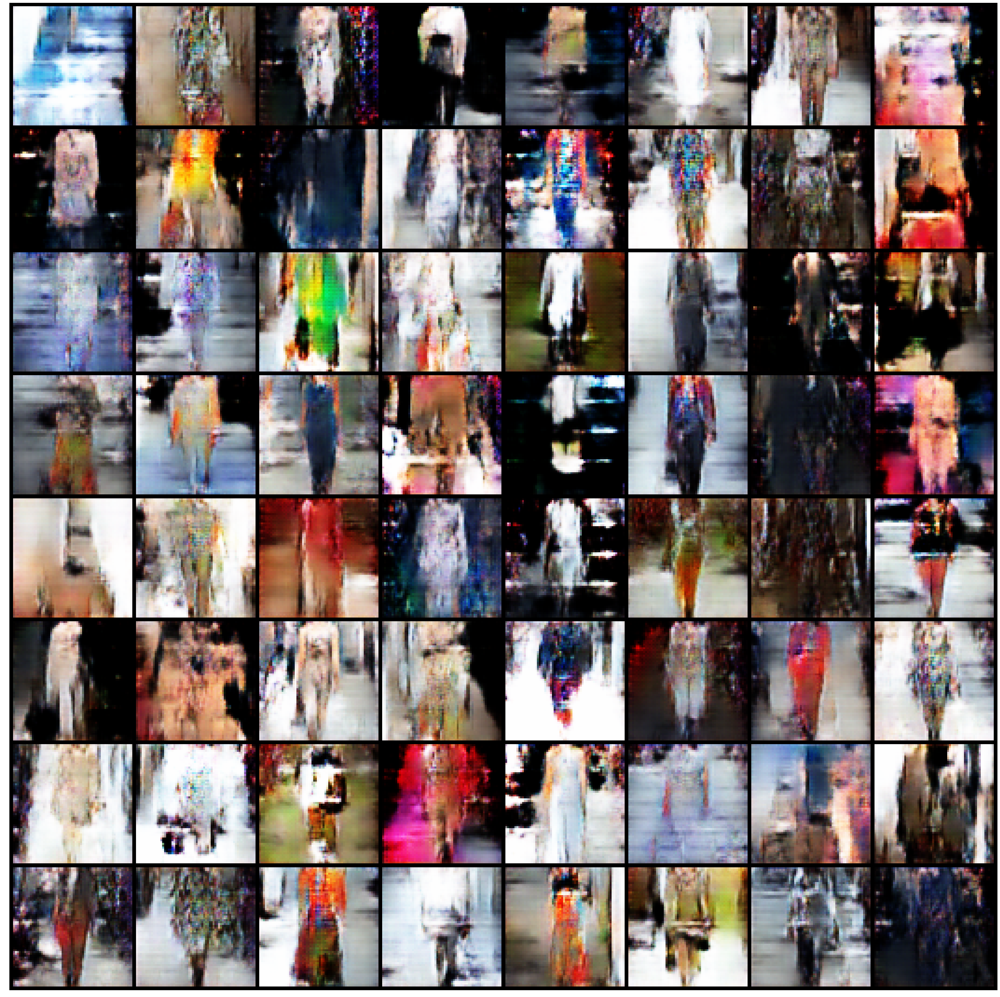

In [14]:
#%%capture
fig = plt.figure(figsize=(64,64))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

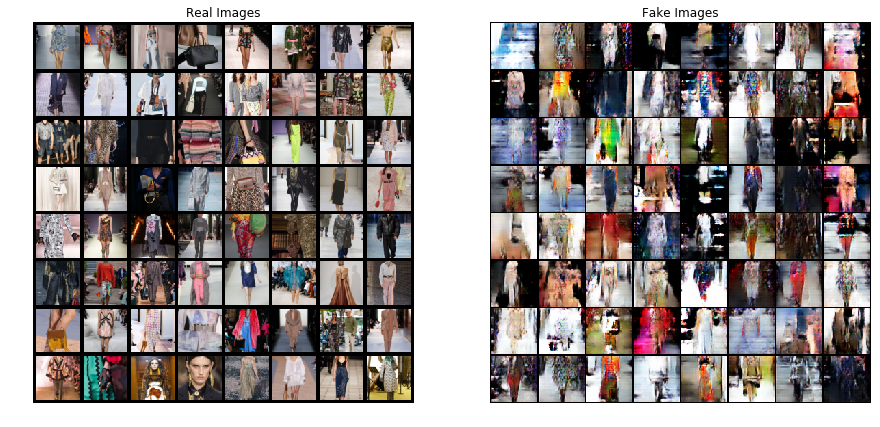

In [13]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [27]:
os.getcwd()

'/home/ubuntu'

In [30]:
print(netD)
torch.save(netD, '/home/ubuntu')


Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


IsADirectoryError: [Errno 21] Is a directory: '/home/ubuntu'

In [18]:
torch.save(netG, '/home/ubuntu/data')

/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type Generator. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
